https://stackoverflow.com/questions/57713358/how-to-rotate-skewed-fingerprint-image-to-vertical-upright-position

https://stackoverflow.com/questions/49907382/how-to-remove-whitespace-from-an-image-in-opencv

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

In [5]:
def show_map(img):
    fig, ax = plt.subplots(figsize = (15,7))
    ax.imshow(img)
    plt.show()

In [6]:
def rotate_crop_map(map_img):
    gray = cv.cvtColor(map_img, cv.COLOR_RGB2GRAY)
    gray = 255 - gray
    thresh = cv.threshold(gray, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)[1]

    # Compute rotated bounding box
    coords = np.column_stack(np.where(thresh > 0))
    center_rect, dims, angle = cv.minAreaRect(coords)

    if angle < -45:
        angle = -angle
    else:
        angle = 90-angle
    print(angle)

    # Rotate image to deskew
    (h, w) = map_img.shape[:2]
    center = (w // 2, h // 2)
    M = cv.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv.warpAffine(map_img, M, (w, h), flags=cv.INTER_CUBIC, borderMode=cv.BORDER_REPLICATE)

    gray = cv.cvtColor(rotated, cv.COLOR_BGR2GRAY)
    gray = 255*(gray < 128).astype(np.uint8) # To invert the text to white
    coords = cv.findNonZero(gray) # Find all non-zero points (text)
    x, y, w, h = cv.boundingRect(coords) # Find minimum spanning bounding box
    rect = rotated[y:y+h, x:x+w] 
    rect = cv.cvtColor(rect, cv.COLOR_BGR2RGB)
    
    return rect

0.8036956787109375


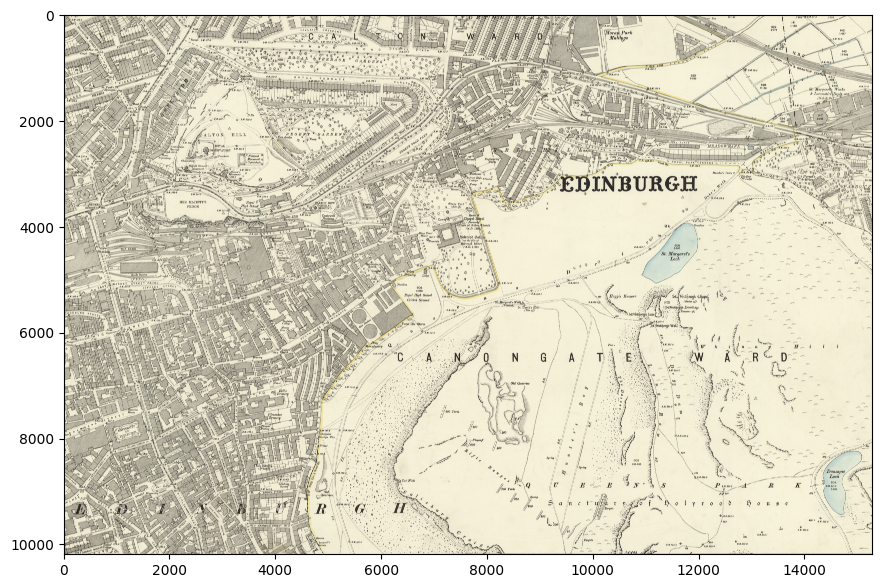

In [7]:
map_1 = cv.imread("data/originals/82877409.27.tif")
fix_map_1 = rotate_crop_map(map_1)
show_map(fix_map_1)

0.8036727905273438


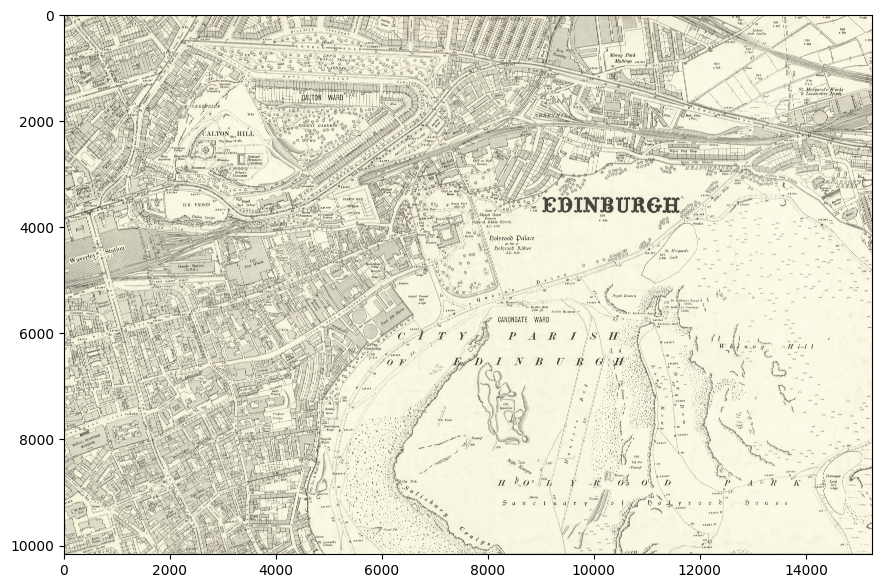

In [8]:
map_2 = cv.imread("data/originals/82877412.27.tif")
fix_map_2 = rotate_crop_map(map_2)
show_map(fix_map_2)

0.8036727905273438


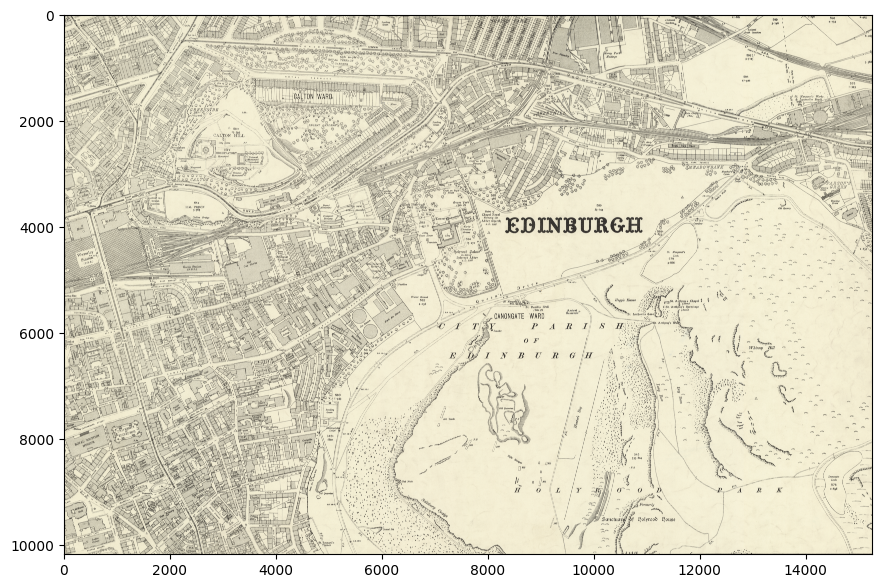

In [9]:
map_3 = cv.imread("data/originals/82877415.27.tif")
fix_map_3 = rotate_crop_map(map_3)
show_map(fix_map_3)

0.8036727905273438


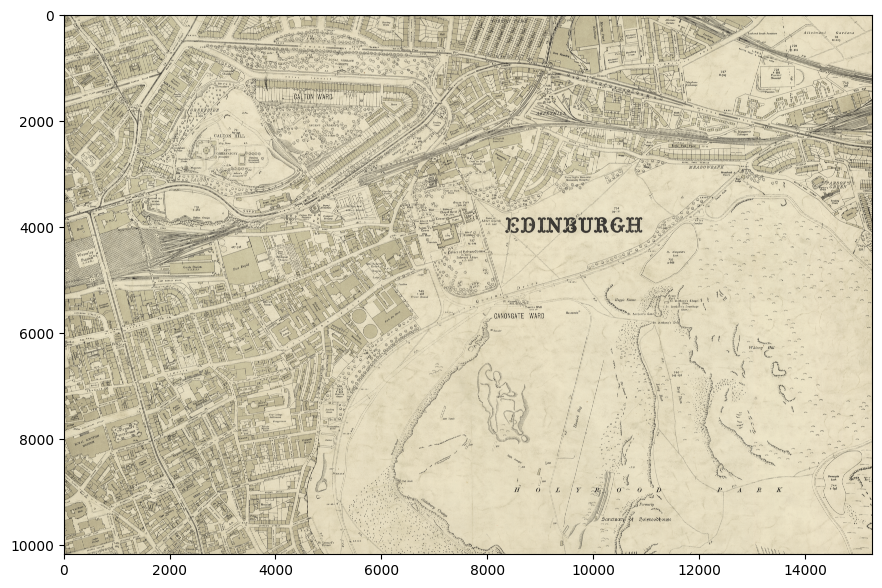

In [10]:
map_4 = cv.imread("data/originals/82877418.27.tif")
fix_map_4 = rotate_crop_map(map_4)
show_map(fix_map_4)

In [11]:
print(fix_map_1.shape)
print(fix_map_2.shape)
print(fix_map_3.shape)
print(fix_map_4.shape)

(10187, 15281, 3)
(10166, 15249, 3)
(10169, 15254, 3)
(10178, 15266, 3)


In [12]:
print(map_1.shape)
print(map_2.shape)

(11836, 16913, 3)
(12330, 16972, 3)


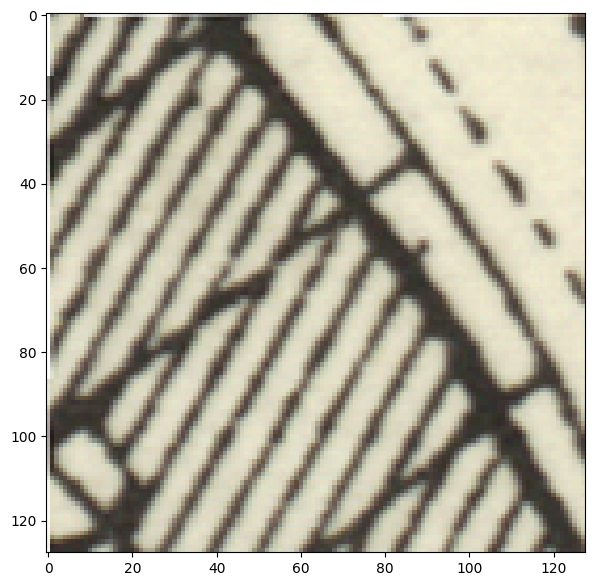

In [13]:
show_map(fix_map_1[:128,:128])

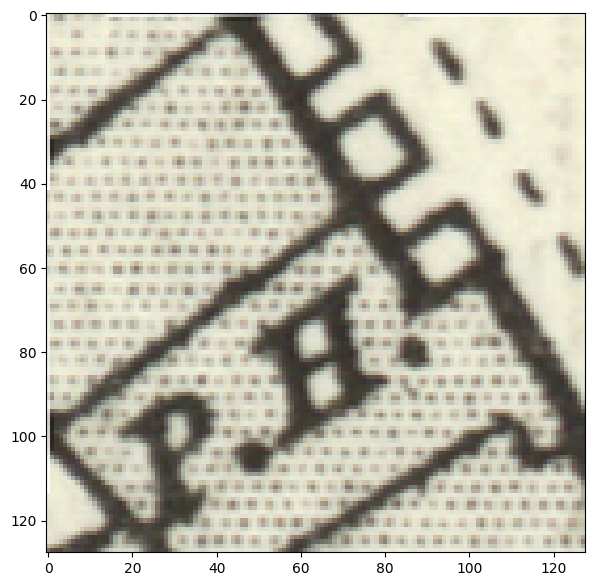

In [14]:
show_map(fix_map_2[:128,:128])

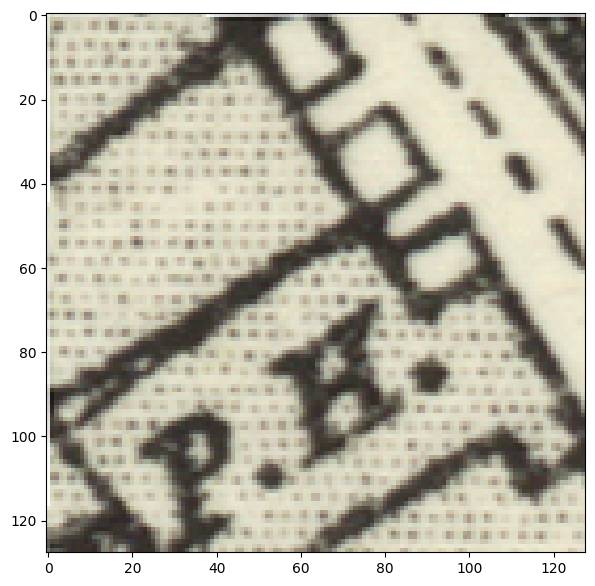

In [15]:
show_map(fix_map_3[:128,:128  ])

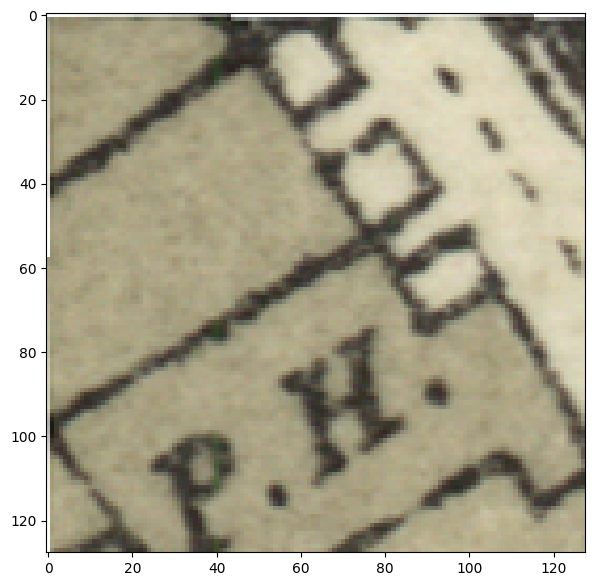

In [16]:
show_map(fix_map_4[:128,:128])

In [18]:
from PIL import Image

In [23]:
pil_map_1 = Image.fromarray(fix_map_1)
pil_map_1.save("data/map_1.tif")

pil_map_2 = Image.fromarray(fix_map_2)
pil_map_2.save("data/map_2.tif")

pil_map_3 = Image.fromarray(fix_map_3)
pil_map_3.save("data/map_3.tif")

pil_map_4 = Image.fromarray(fix_map_4)
pil_map_4.save("data/map_4.tif")

In [70]:
from skimage.measure import block_reduce

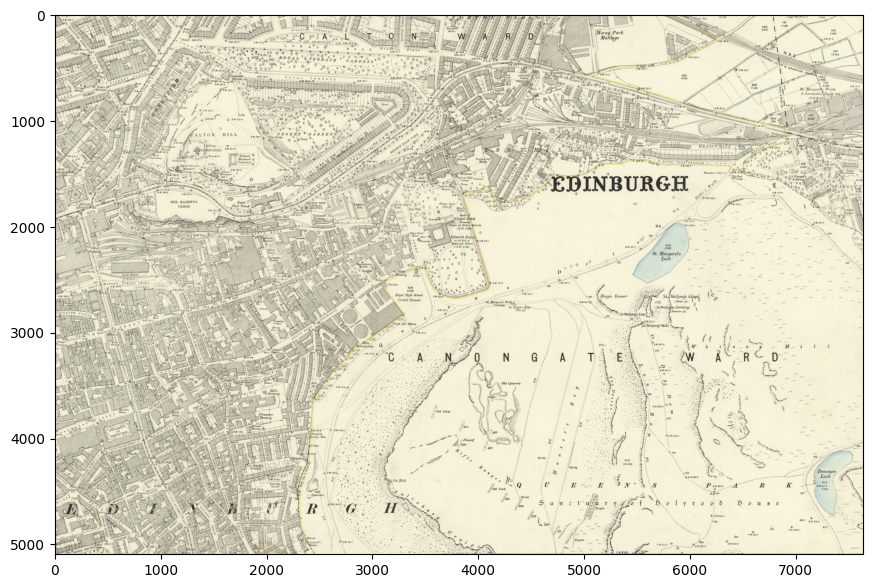

In [78]:
red_map_1_max = block_reduce(fix_map_1, block_size = (2,2,1), func = np.max)
show_map(red_map_1_max)

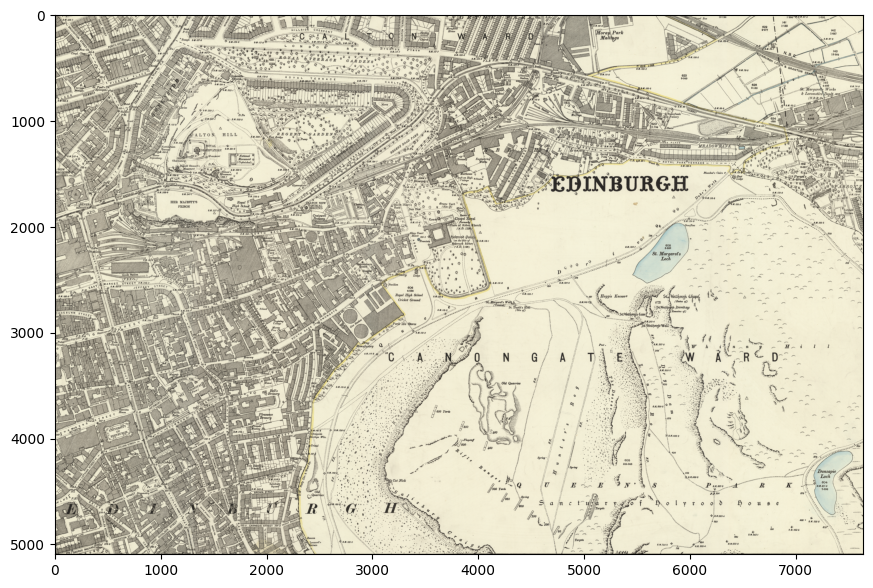

In [79]:
red_map_1_min = block_reduce(fix_map_1, block_size = (2,2,1), func = np.min)
show_map(red_map_1_min)

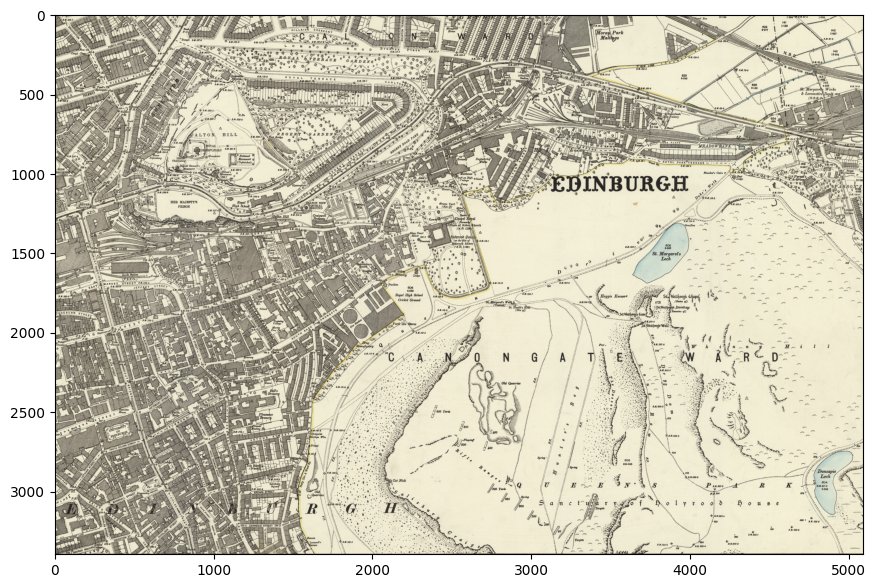

In [80]:
red_map_1_min_3 = block_reduce(fix_map_1, block_size = (3,3,1), func = np.min)
show_map(red_map_1_min_3)

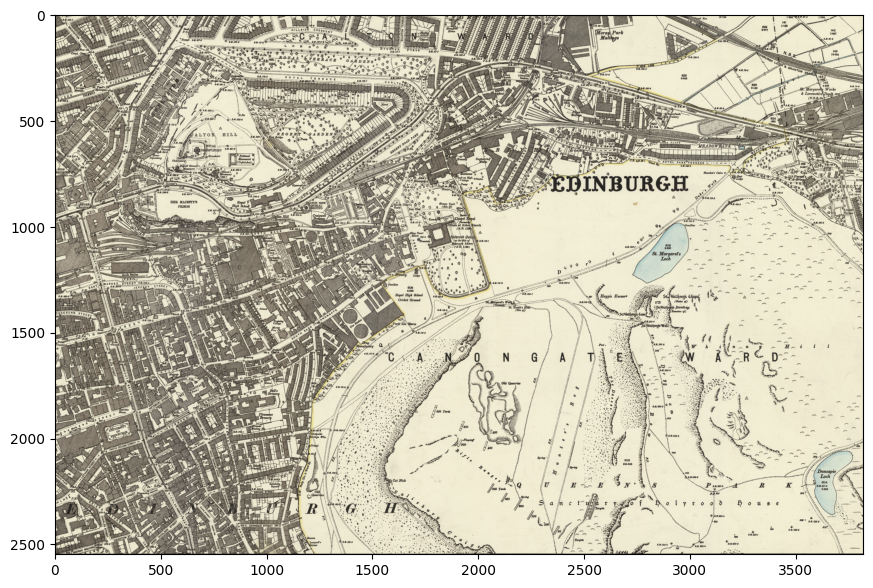

In [81]:
red_map_1_min_4 = block_reduce(fix_map_1, block_size = (4,4,1), func = np.min)
show_map(red_map_1_min_4)

In [90]:
def med_reduce(x, axis):
    return np.median(x,axis).astype(np.int32)

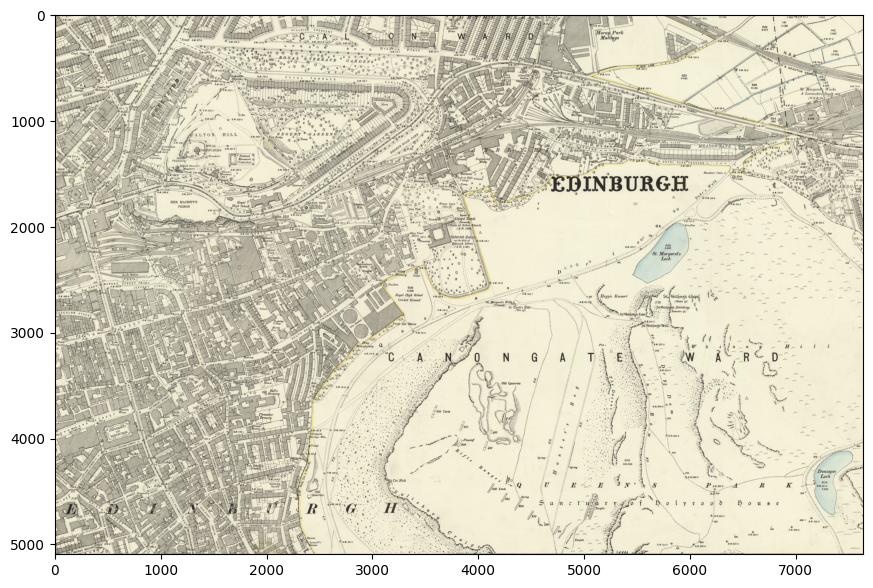

In [91]:
red_map_1_med = block_reduce(fix_map_1, block_size = (2,2,1), func = med_reduce)
show_map(red_map_1_med)

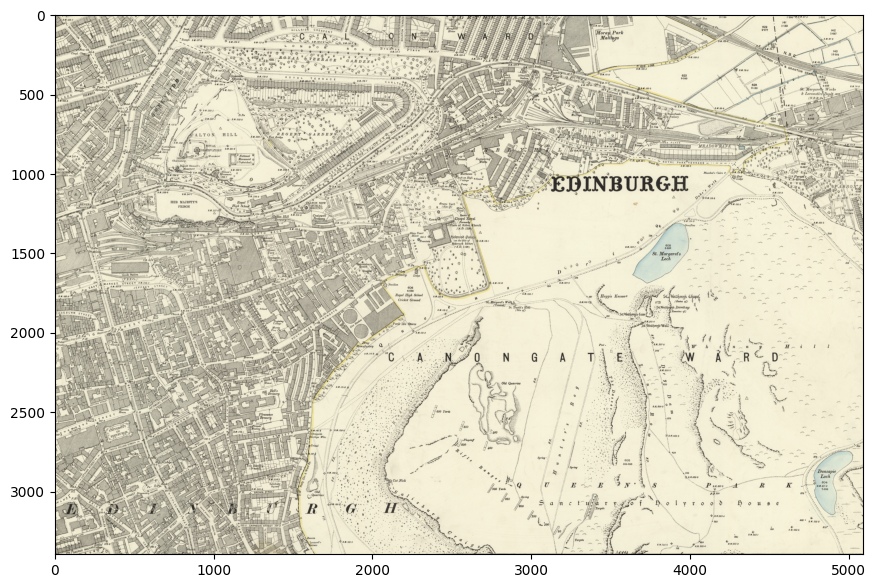

In [92]:
red_map_1_med_3 = block_reduce(fix_map_1, block_size = (3,3,1), func = med_reduce)
show_map(red_map_1_med_3)

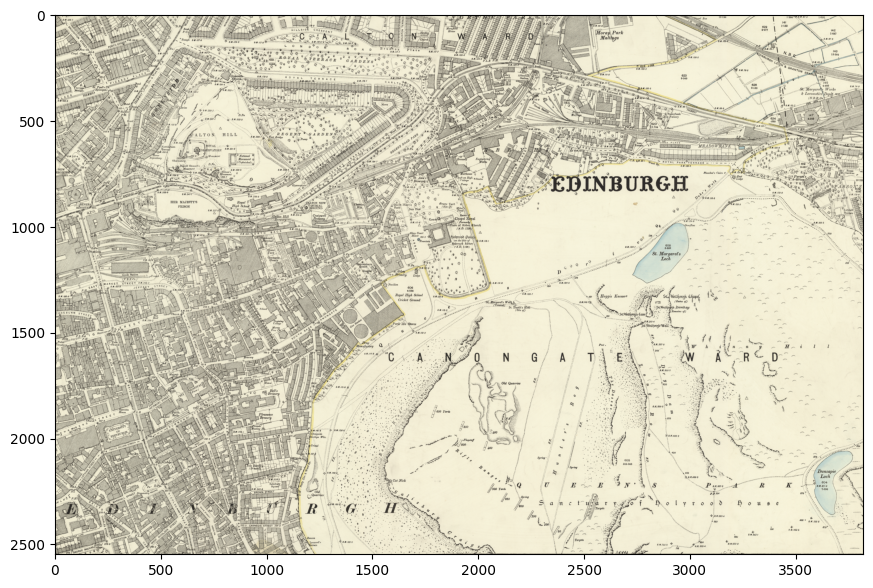

In [93]:
red_map_1_med_4 = block_reduce(fix_map_1, block_size = (4,4,1), func = med_reduce)
show_map(red_map_1_med_4)

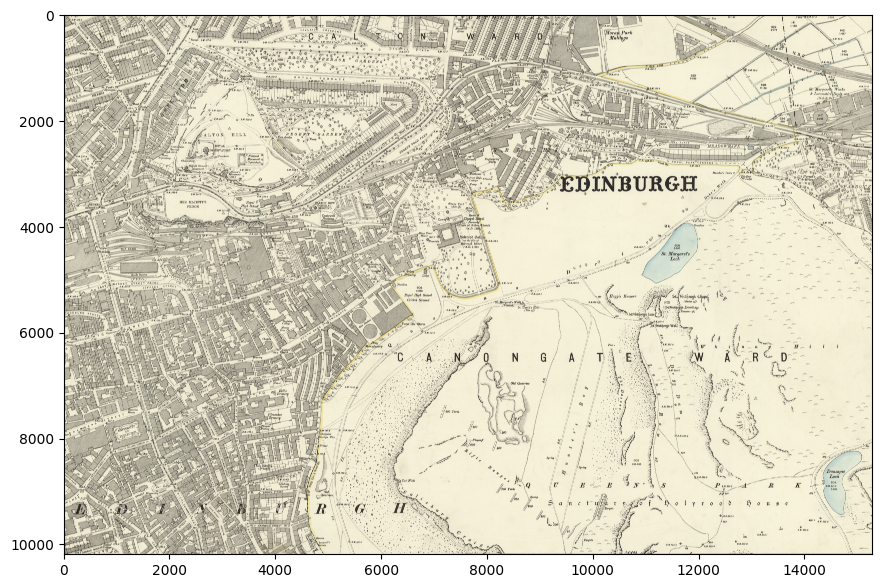

In [94]:
show_map(fix_map_1)

In [159]:
map_dict = {"original": (fix_map_1,1),
            "min_2": (red_map_1_min,2),
            "min_3": (red_map_1_min_3,3),
            "min_4": (red_map_1_min_4,4),
            "med_2": (red_map_1_med,2),
            "med_3": (red_map_1_med_3,3),
            "med_4": (red_map_1_med_4,4)}

In [166]:
def compare_map_transforms(map_dict, patch_size, origin, n_transforms, save = None):
    rows = (len(map_dict)-1)//n_transforms
    cols = n_transforms+1
    fig, ax = plt.subplots(rows,cols,figsize = (cols*5,rows*5))

    for i, (name, (map_, scale)) in enumerate(map_dict.items()):
        x = origin[0]//scale
        y = origin[1]//scale
        patch = map_[x:x + patch_size, y:y + patch_size]
        if i == 0:
            for j in range(rows):
                ax[j,0].imshow(patch)
                ax[j,0].set_title(name)
        else:
            k = i-1
            ax[k % rows, 1 + k//rows].imshow(patch)
            ax[k % rows, 1 + k//rows].set_title(name)
            
    if save is not None:
        plt.savefig(save)
        
    plt.show()

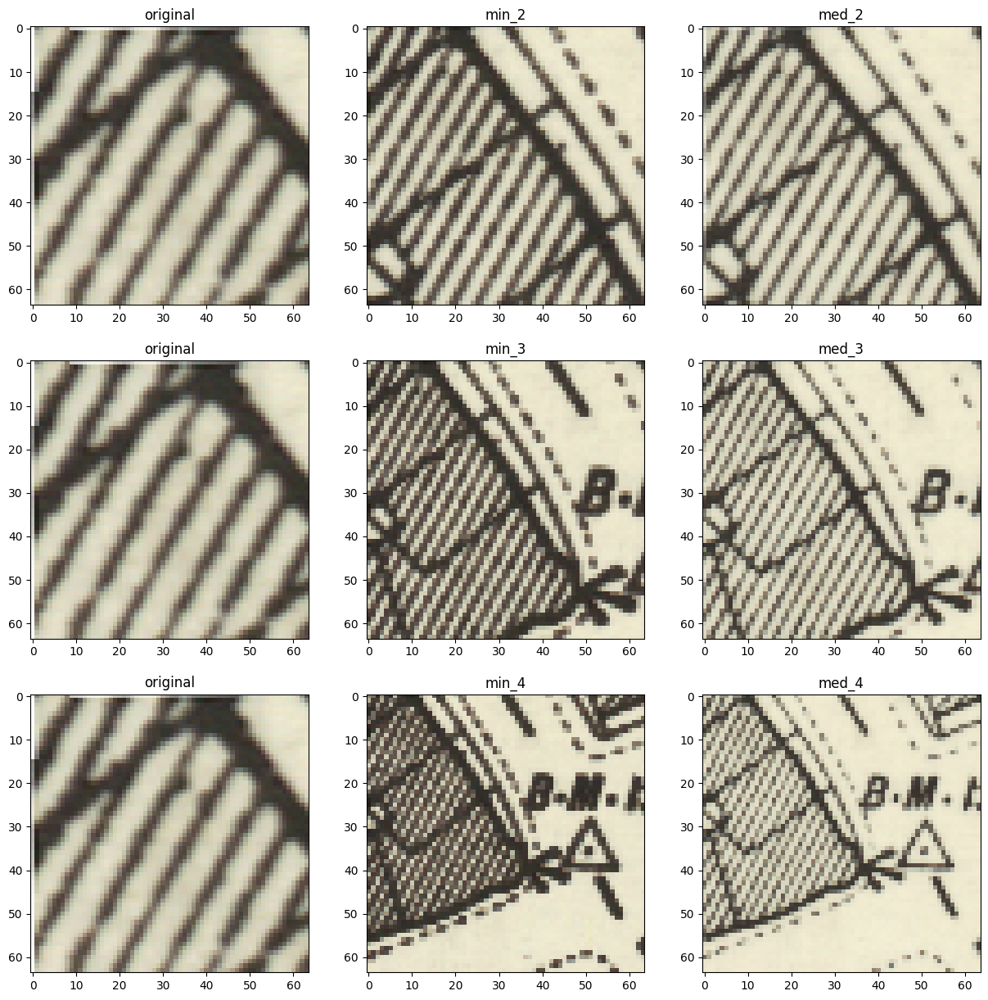

In [168]:
compare_map_transforms(map_dict, 64, (0,0), n_transforms=2, save = "data/patch_sample_transforms/0_0_64.png")

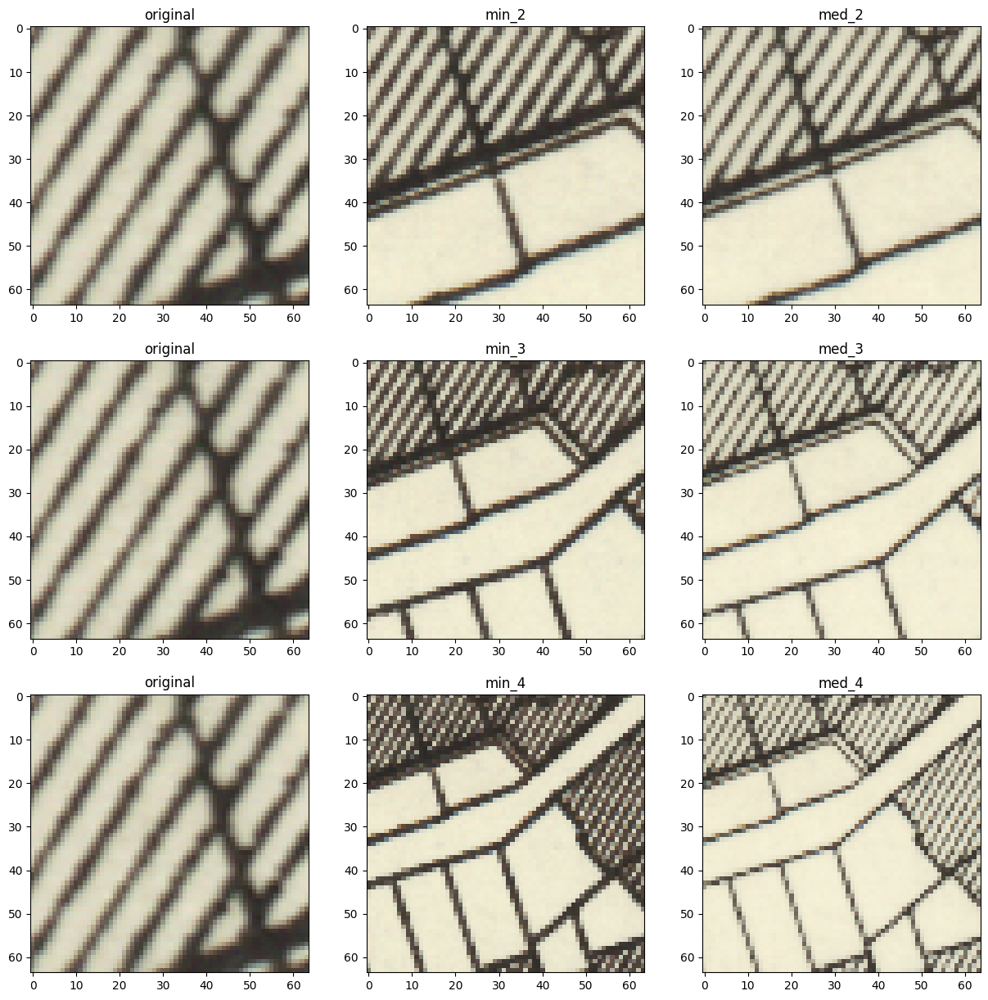

In [169]:
compare_map_transforms(map_dict, 64, (345,36), n_transforms=2, save = "data/patch_sample_transforms/345_36_64.png")

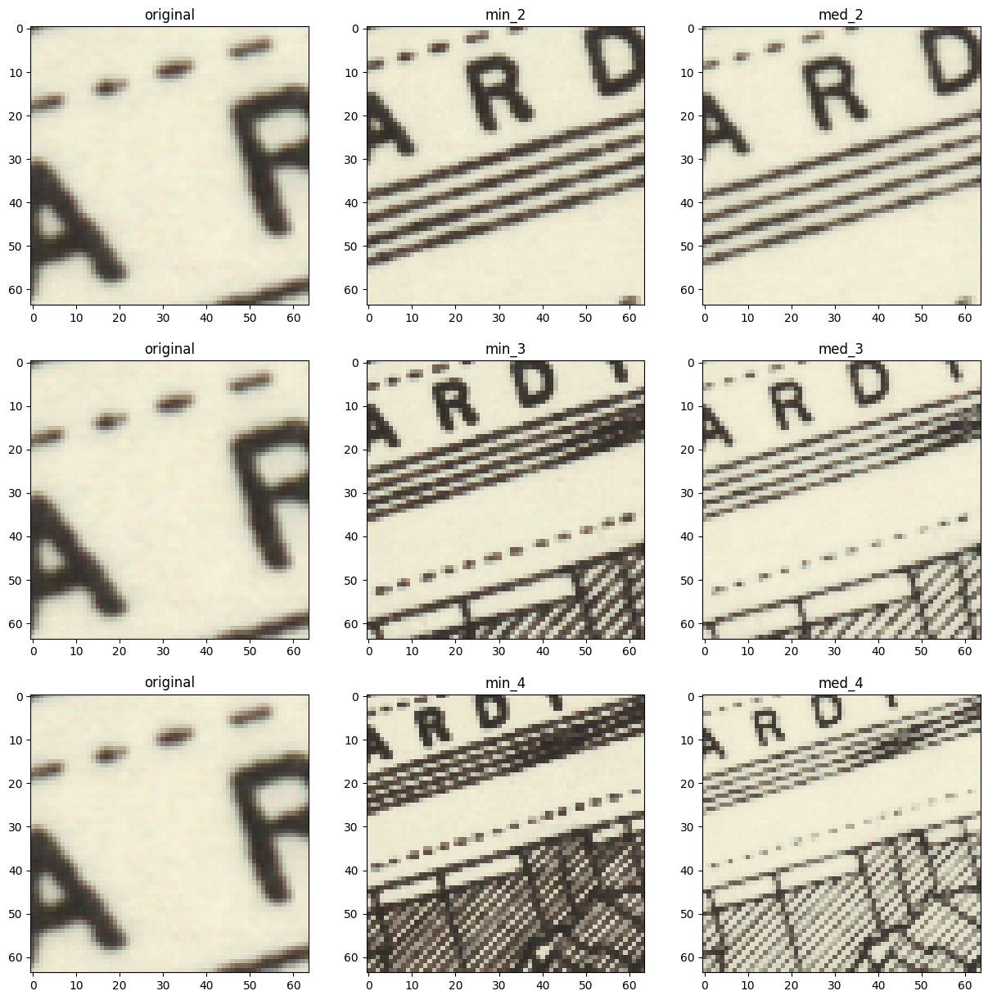

In [170]:
compare_map_transforms(map_dict, 64, (1200,1200), n_transforms=2, save = "data/patch_sample_transforms/1200_1200_64.png")

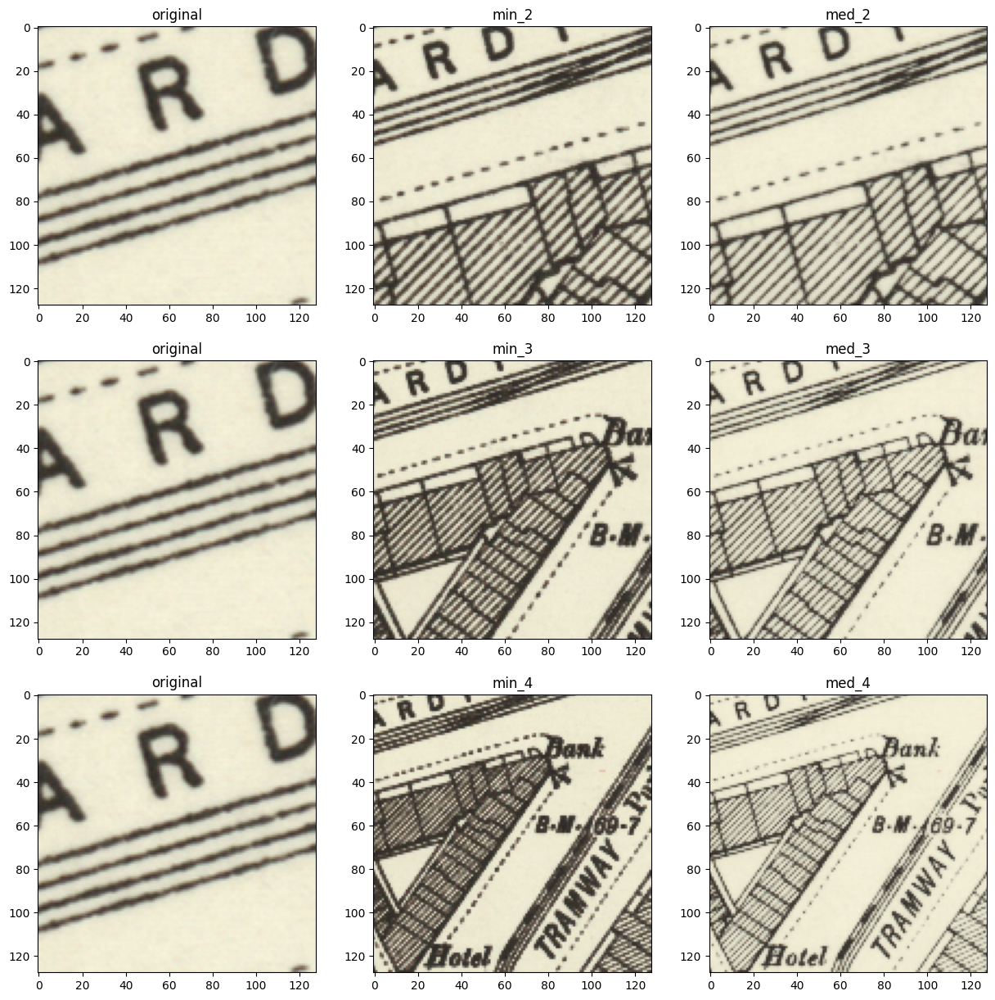

In [171]:
compare_map_transforms(map_dict, 128, (1200,1200), n_transforms=2, save = "data/patch_sample_transforms/1200_1200_128.png")

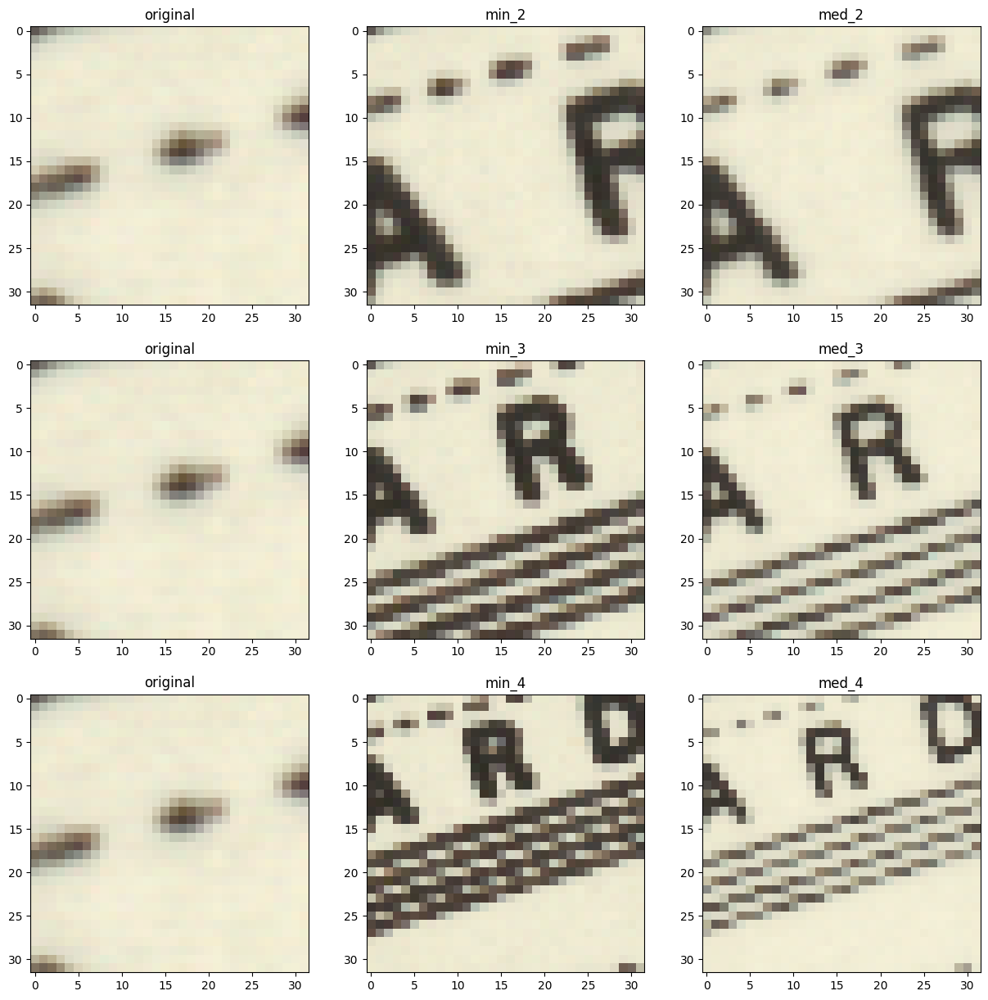

In [172]:
compare_map_transforms(map_dict, 32, (1200,1200), n_transforms=2, save = "data/patch_sample_transforms/1200_1200_32.png")